# Week 9 - Multivariate Analysis, part 2

# 1. Lesson - no lesson this week

# 2. Weekly graph question

The graph below plots the first two principal component scores in a scatter plot.  What can be said about the three outliers in the upper left corner of the graph?  Is their first principal component score high or low?  What about their second principal component score?  What does that mean about their values in series_1, series_2, and series_3?  It seems to me that you can say something about series_3 (what can you say?) but you may have a harder time saying something about series_1 and series_2, and an almost impossible time saying anything about the relative values of series_1 and series_2.  Why is that?  How are series_1 and series_2 related, according to how they were created?  If you like, try drawing a pairplot for all three series and see what you get.

Overall, what are the advantages and disadvantages of the graph below?  Does it show anything interesting?

c:\Users\Owner\anaconda3\Lib\site-packages\pandas\core\computation\expressions.py:22: UserWarning: Pandas requires version '2.10.2' or newer of 'numexpr' (version '2.10.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


[0.79916477 0.18990532 0.01092991]
[[ 0.26541493  0.30096233  0.91595665]
 [ 0.60337553  0.6891417  -0.40127506]
 [ 0.75199261 -0.65917023 -0.00131519]]


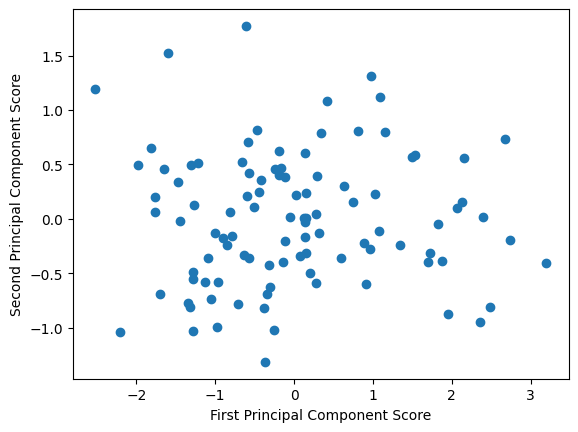

In [ ]:
import numpy as np
import pandas as pd
from sklearn import decomposition
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels as sm

from omds_functions import show_missing_columns, find_missing, find_outliers, regplotter

np.random.seed(0)
num_points = 100
series_1 = np.random.normal(loc = 2, scale = 0.5, size = num_points)
series_2 = series_1 * (1 + np.random.normal(loc = 0, scale = 0.1, size = num_points))
series_3 = series_1 * (1 + np.random.normal(loc = 0, scale = 0.5, size = num_points))
df = pd.DataFrame({'ser1': series_1, 'ser2': series_2, 'ser3': series_3})
df = df - df.mean() # set mean to zero, so we don't have to subtract mean from the principal component scores

pca3 = decomposition.PCA(n_components = 3)
pca3.fit(df)
print(pca3.explained_variance_ratio_)
print(pca3.components_)

first_principal_component_score = df.dot(pca3.components_[0])
second_principal_component_score = df.dot(pca3.components_[1])
plt.scatter(first_principal_component_score, second_principal_component_score)
plt.xlabel("First Principal Component Score")
plt.ylabel("Second Principal Component Score");

### Answers
Main thing of note:
The upper-left outliers are driven mostly by series_3 being unusually low relative to series_1 and series_2.

The upper-left outliers are visible in the PC1-vs-PC2 plot and are characterized by low PC1 (left) and high PC2 (up). This pattern is mainly driven by series_3 being unusually low relative to series_1 and series_2. 

So those outliers are points where series_3 deviates downward from the shared trend of series_1 and series_2. That fits how data were generated: series_3 has much larger noise (scale 0.5 vs 0.1 for series_2), so it creates the extreme points.

Series_1 and series_2 have a strong linear relationship because series_2 was generated from series_1 with relatively small noise. Series_3 was generated with much larger noise, so it departs more from that trend and creates the most extreme points.

The way the series were created based series_2 and series_3 on series_1 with a scale differential. The way in which they were generated makes series 3 much noisier and more likely to produce outliers. 

Series_1 and series_2 have a strong linear relationship because series_2 was generated from series_1 with small noise. Series_3 was generated with much larger noise (scale 0.5 vs 0.1 for the multiplier noise), so it departs more from that trend and creates more extreme points.

The graph does attempt to show correlations between the series. It is better seen in the pairplot of the dataframe below. The graph does show very obviously outliers. Because this is a PCA 1 vs PCA 2 graph, you are not seeing the actual data, but rather a graph of how the first two PCA components represent the underlying data.

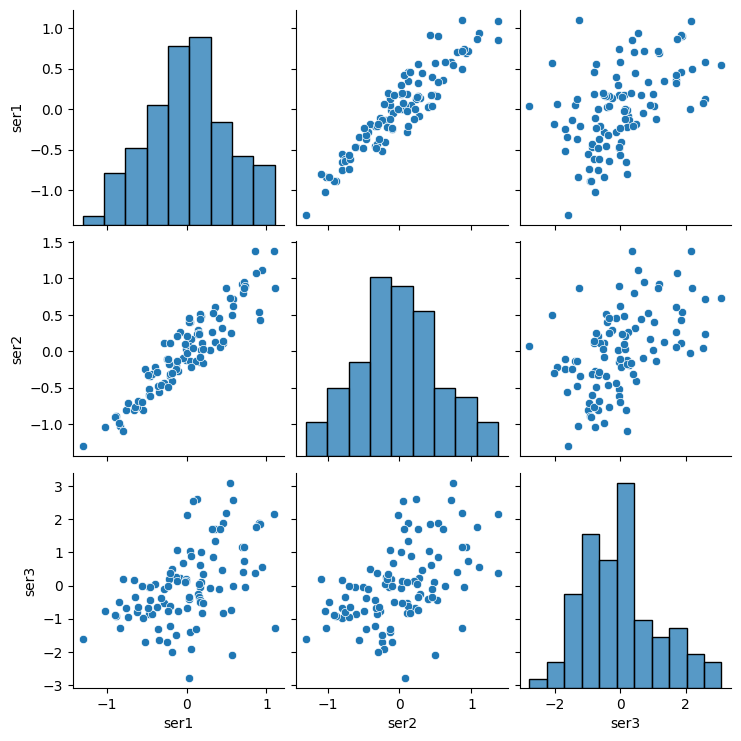

In [3]:
sns.pairplot(df);

# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

Here are some types of analysis you can do:
Draw heatmaps.

Draw bubble plots.

Perform Principal Component Analysis to find out the directions in which the data varies.  Can you represent the data using only its projection onto its first principal component, using the methods described in Week 8?  How much of the variance would this capture?

Try performing linear regression analysis using different sets of features.  Which features seem most likely to be useful to predict other features?

Conclusions:
Explain what conclusions you would draw from this analysis: are the data what you expect? Are the data likely to be usable? If the data are not useable, find some new data!

Do you see any outliers? (Data points that are far from the rest of the data).

Does the Principal Component Analysis suggest a way to represent the data using fewer dimensions than usual - using its first one or two principal component scores, perhaps?

Try using your correlation information from previous weeks to help choose features for linear regression.

In [4]:
dcd25_renamed = pd.read_csv('..\dcd25_renamed.csv')

#### Histogram of dataset

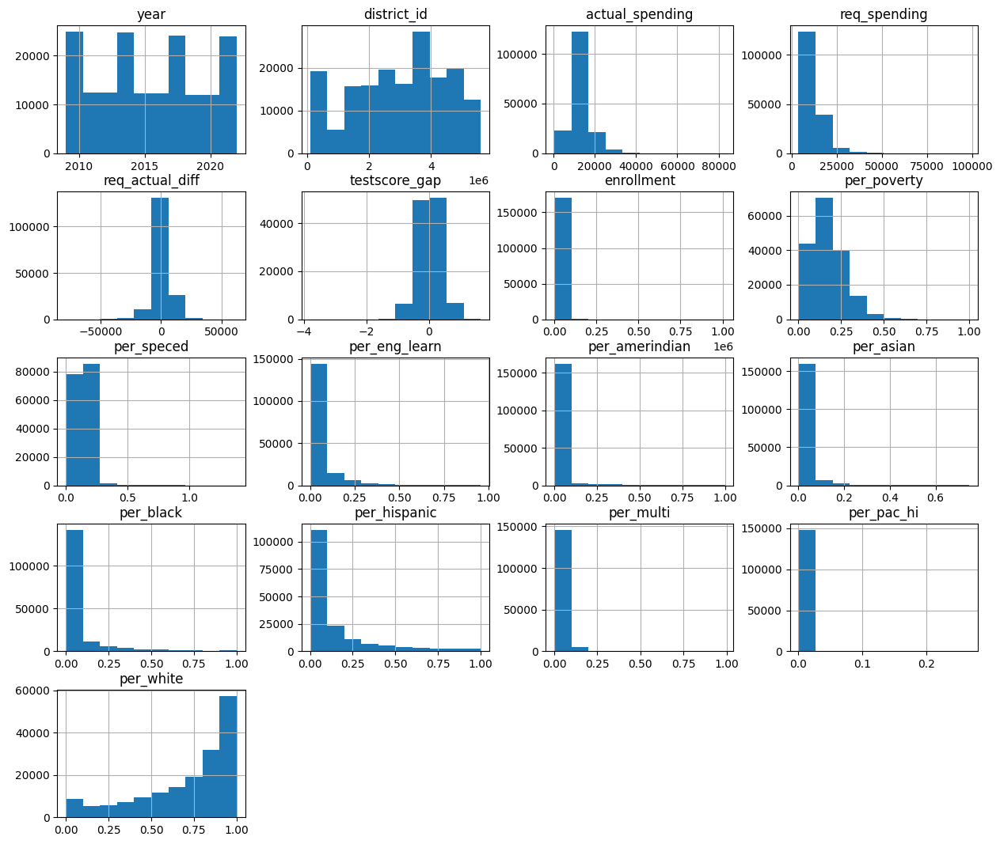

In [5]:
figsize = (15, 13)
dcd25_renamed.hist(figsize=figsize);

#### Correlation Heatmap

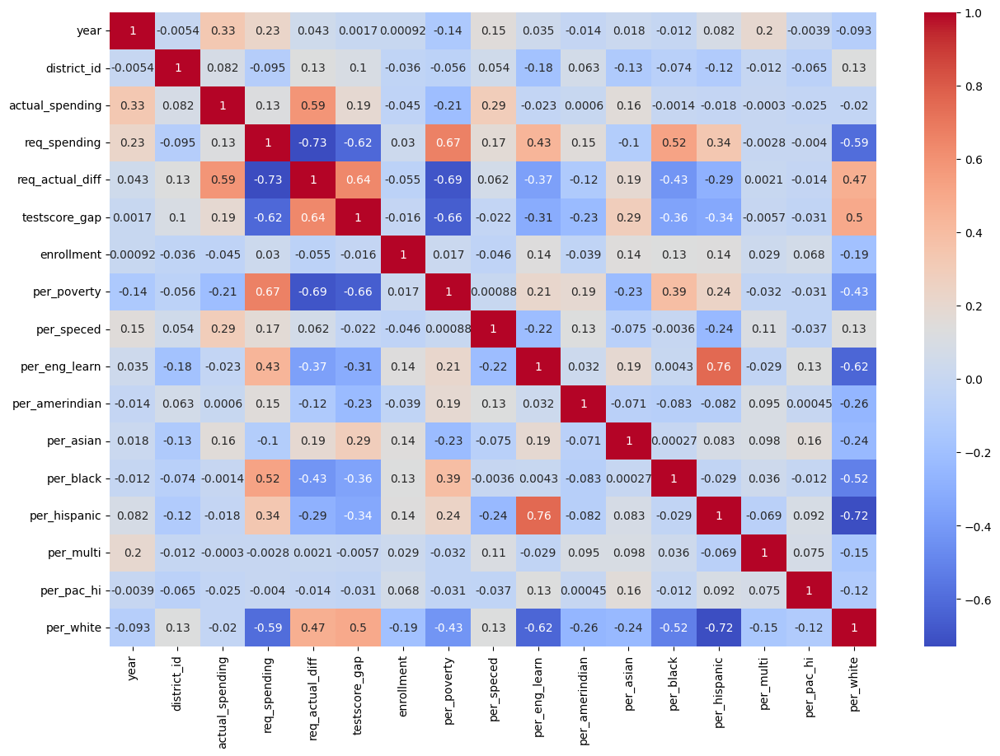

In [6]:
# correlation heatmap of dcd25 after drops and renames
dcd25 = pd.read_csv('..\dcd25_renamed.csv')
dcd25_numeric = dcd25.select_dtypes(include = [np.number])
plt.figure(figsize = (15, 10))
sns.heatmap(dcd25_numeric.corr(), annot = True, cmap = 'coolwarm');


### Pairplot of DCD 2025 numeric dataframe

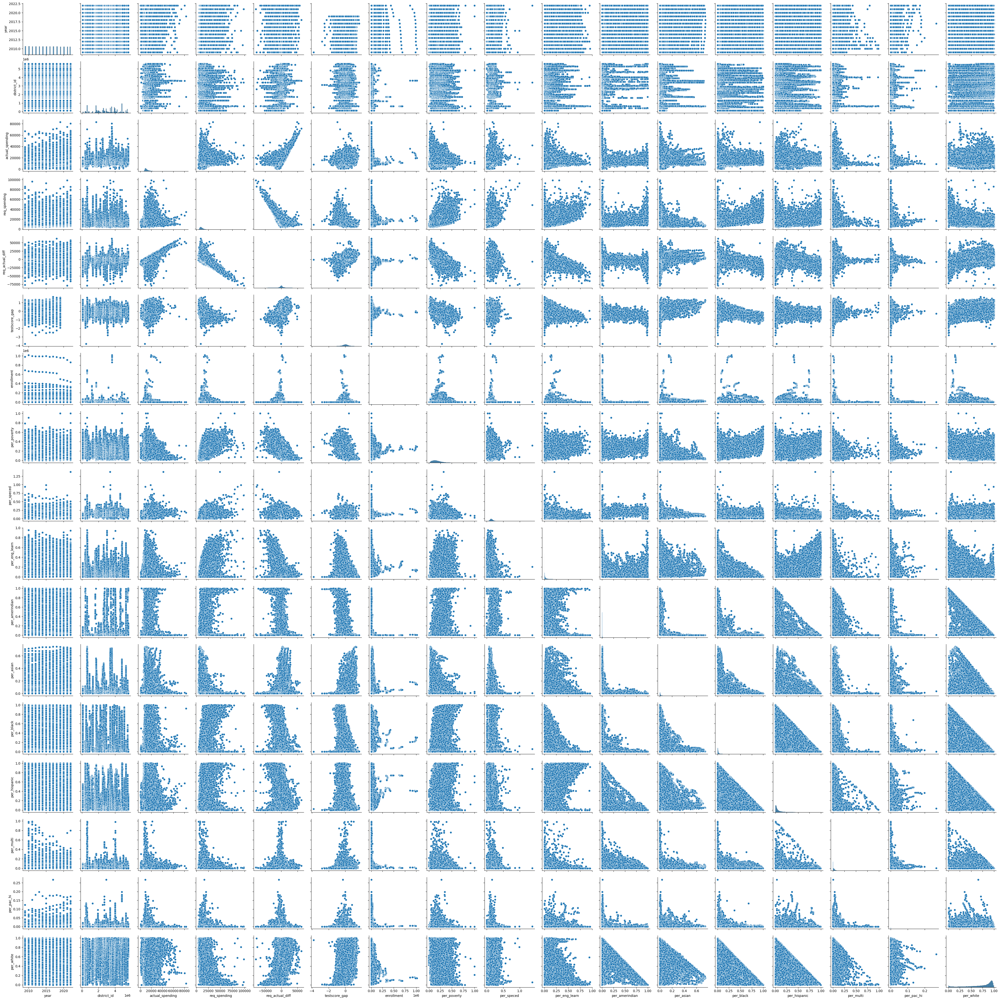

In [7]:
sns.pairplot(dcd25_numeric);

I wanted to see what this would look like, but the result was not as informative as I had hoped.

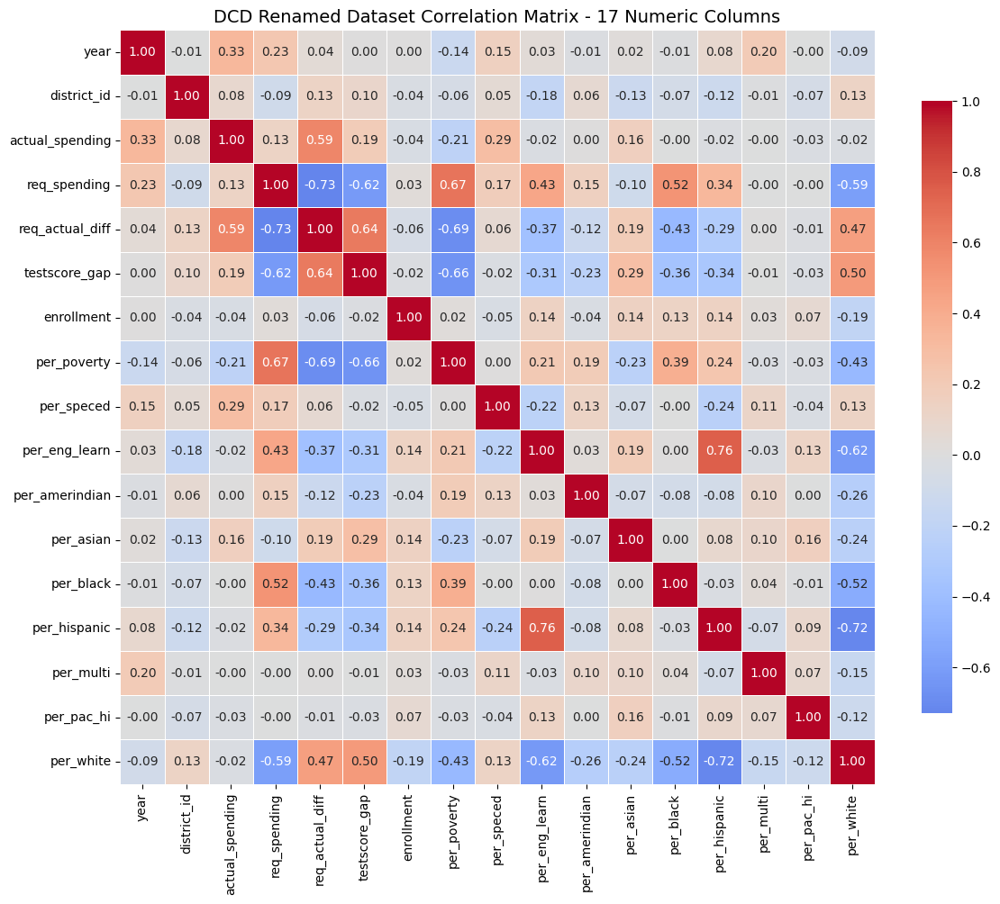

In [8]:
column_to_start = 0
column_to_end = 17

dcd25_renamed_numeric_columns = dcd25_renamed.select_dtypes(include=['int64', 'float64']).columns.tolist()
dcd25_renamed_numeric_data = dcd25_renamed[dcd25_renamed.columns.intersection(dcd25_renamed_numeric_columns)].iloc[:, column_to_start:column_to_end]

# Calculate correlation matrix for numeric columns
corr_matrix = dcd25_renamed_numeric_data.corr(numeric_only=True)

# Create correlagram
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
            fmt='.2f', square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('DCD Renamed Dataset Correlation Matrix - {0} Numeric Columns'.format(column_to_end - column_to_start), fontsize=14)
plt.tight_layout()
plt.show()
plt.close()

This graph represents all the numeric columns in the dcd25_renamed dataset, which are from column index 0 to 16 (inclusive). The heatmap shows the pairwise correlation coefficients between these numeric columns, with values ranging from -1 (perfect negative correlation) to +1 (perfect positive correlation). The color intensity indicates the strength of the correlation, with darker colors representing stronger correlations.

This shows a strong correlation (0.76) between the percent of hispanic students within a district (per_hispanic) and the percent of English language learners (per_eng_learn). This is not surprising, and should be investigated further.

In a smaller dataset, like the district cost dataset - which has only 17 numeric features, I believe that an annotated correlation matrix gives one more information than a correlogram.

#### Bubble plots

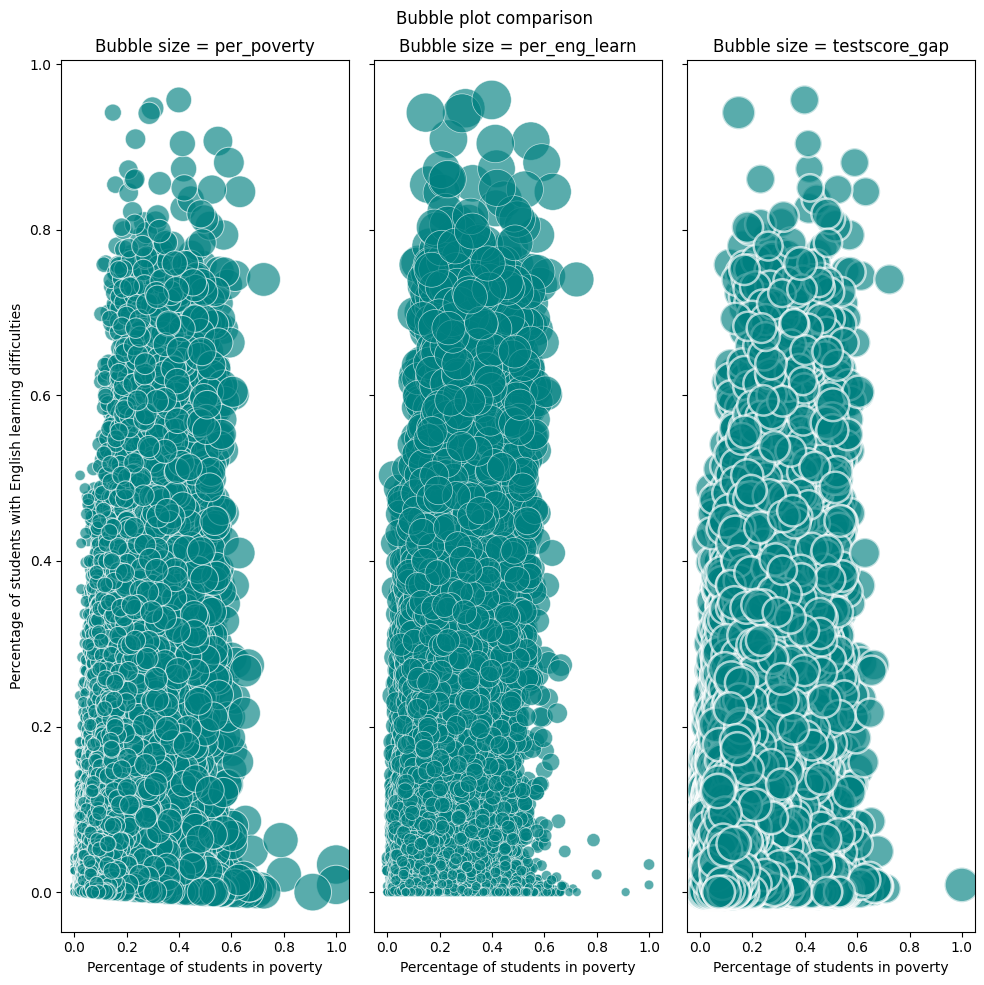

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

size_columns = ["per_poverty", "per_eng_learn", "testscore_gap"]
fig, axes = plt.subplots(1, 3, figsize = (10, 10), sharex = True, sharey = True)

for ax, size_col in zip(axes, size_columns):
    sns.scatterplot(
        data = dcd25_renamed,
        x = "per_poverty",
        y = "per_eng_learn",
        size = size_col,
        sizes = (40, 800),
        alpha = 0.65,
        color = "teal",
        legend = False,
        ax = ax
    )
    ax.set_title(f"Bubble size = {size_col}")
    ax.set_xlabel("Percentage of students in poverty")
    ax.set_ylabel("Percentage of students with English learning difficulties")

fig.suptitle("Bubble plot comparison")
plt.tight_layout()
plt.show()

##### testscore gap vs req_actual spending diff with enrollment as size

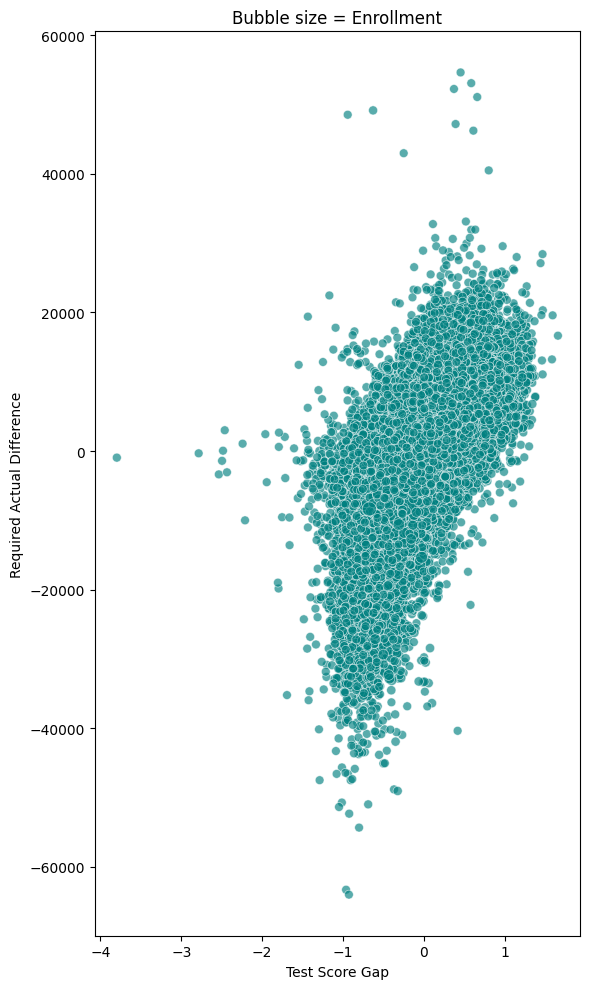

In [10]:
fig, ax = plt.subplots(figsize=(6, 10))

sns.scatterplot(
    data=dcd25,
    x="testscore_gap",
    y="req_actual_diff",
    size="enrollment",
    sizes=(40, 800),
    alpha=0.65,
    color="teal",
    legend=False,
    ax=ax
)

ax.set_title("Bubble size = Enrollment")
ax.set_xlabel("Test Score Gap")
ax.set_ylabel("Required Actual Difference")

plt.tight_layout()
plt.show()

##### Required Spending vs percent poverty with actual spending as bubble size

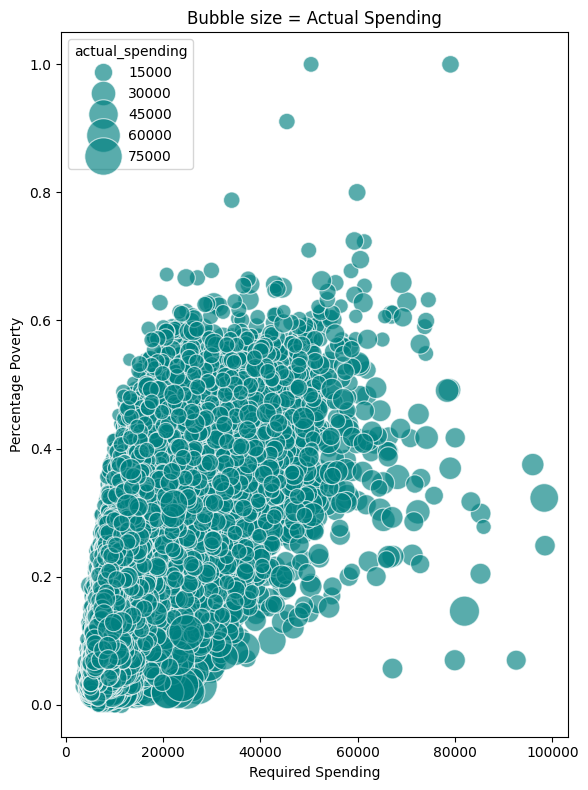

In [11]:
fig, ax = plt.subplots(figsize=(6, 8))

sns.scatterplot(
    data=dcd25,
    x="req_spending",
    y="per_poverty",
    size="actual_spending",
    sizes=(40, 800),
    alpha=0.65,
    color="teal",
    legend=True,
    ax=ax
)

ax.set_title("Bubble size = Actual Spending")
ax.set_xlabel("Required Spending")
ax.set_ylabel("Percentage Poverty")

plt.tight_layout()
plt.show()

##### actual vs req spending with req_act_diff as size

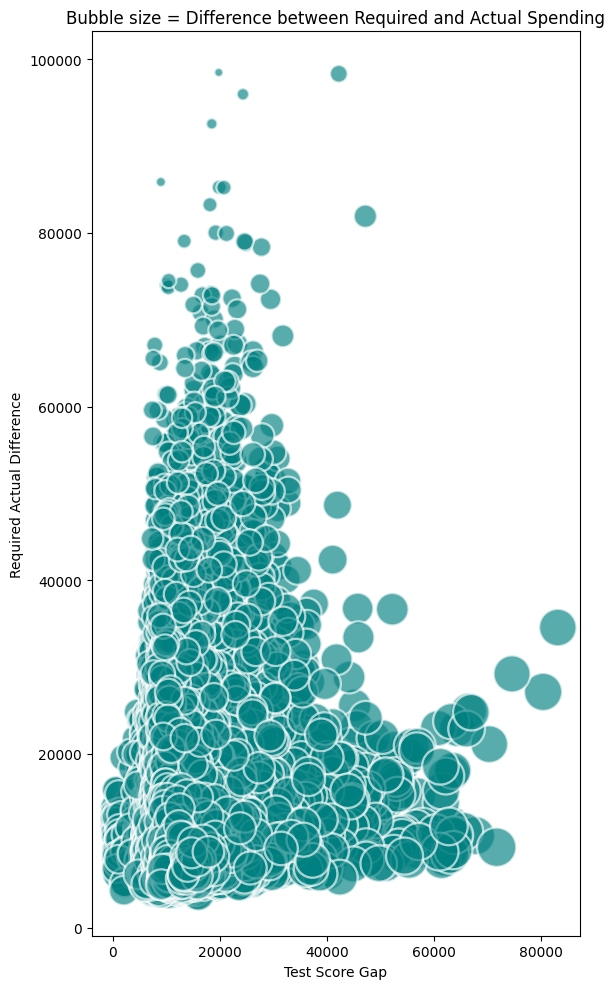

In [12]:
fig, ax = plt.subplots(figsize=(6, 10))

sns.scatterplot(
    data=dcd25,
    x="actual_spending",
    y="req_spending",
    size="req_actual_diff",
    sizes=(40, 800),
    alpha=0.65,
    color="teal",
    legend=False,
    ax=ax
)

ax.set_title("Bubble size = Difference between Required and Actual Spending")
ax.set_xlabel("Test Score Gap")
ax.set_ylabel("Required Actual Difference")

plt.tight_layout()
plt.show()

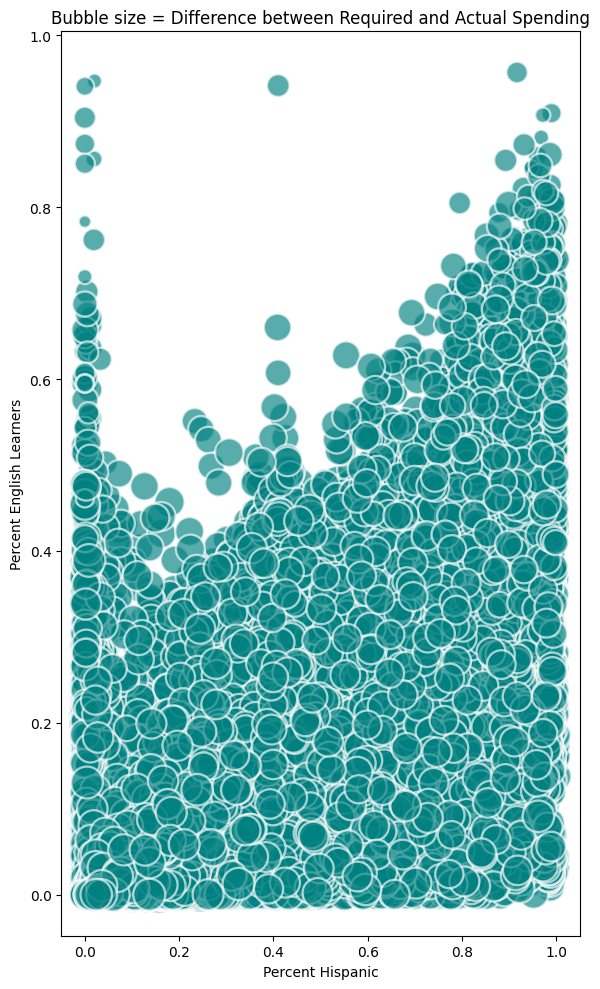

In [13]:
fig, ax = plt.subplots(figsize=(6, 10))

sns.scatterplot(
    data=dcd25,
    x="per_hispanic",
    y="per_eng_learn",
    size="req_actual_diff",
    sizes=(40, 800),
    alpha=0.65,
    color="teal",
    legend=False,
    ax=ax
)

ax.set_title("Bubble size = Difference between Required and Actual Spending")
ax.set_xlabel("Percent Hispanic")
ax.set_ylabel("Percent English Learners")

plt.tight_layout()
plt.show()

#### PCA plots with legends

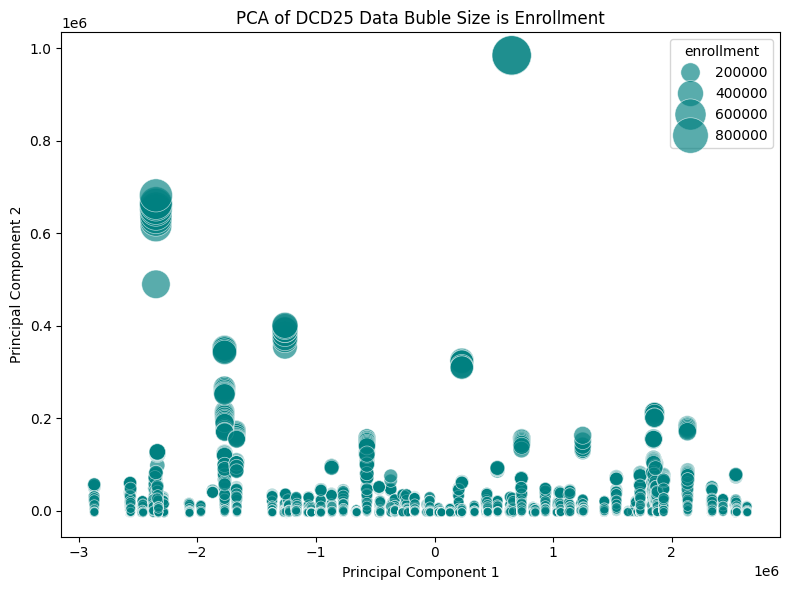

In [14]:
dcd25_dropped = dcd25.dropna()  # drop NaN values for PCA
pca = decomposition.PCA(n_components=2)
pca.fit(dcd25_dropped.select_dtypes(include=[np.number]))  # fit PCA on numeric columns
pca_scores = pca.transform(dcd25_dropped.select_dtypes(include=[np.number]))  # get PCA scores
pca_df = pd.DataFrame(pca_scores, columns=['PC1', 'PC2'])  # create DataFrame for PCA scores
pca_df['enrollment'] = dcd25_dropped['enrollment'].values
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    size='enrollment',
    sizes=(40, 800),
    alpha=0.65,
    color='teal',
    legend=True
)
plt.title("PCA of DCD25 Data Buble Size is Enrollment")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.show()

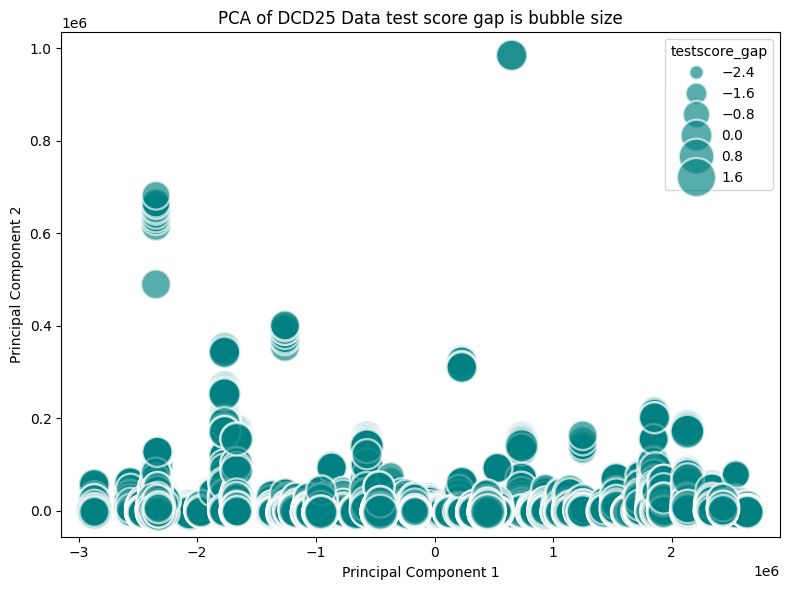

In [15]:
# do PCA on dcd25, then plot the first two principal components with bubble size = testscore_gap
dcd25_dropped = dcd25.dropna()  # drop NaN values for PCA
pca = decomposition.PCA(n_components=2)
pca.fit(dcd25_dropped.select_dtypes(include=[np.number]))  # fit PCA on numeric columns
pca_scores = pca.transform(dcd25_dropped.select_dtypes(include=[np.number]))  # get PCA scores
pca_df = pd.DataFrame(pca_scores, columns=['PC1', 'PC2'])  # create DataFrame for PCA scores
pca_df['testscore_gap'] = dcd25_dropped['testscore_gap'].values
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    size='testscore_gap',
    sizes=(40, 800),
    alpha=0.65,
    color='teal',
    legend=True
)
plt.title("PCA of DCD25 Data test score gap is bubble size")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.tight_layout()
plt.show()

#### Linear Regression plots

##### <b>*</b> Linear regression analysis of testscore_gap vs req_actual_diff

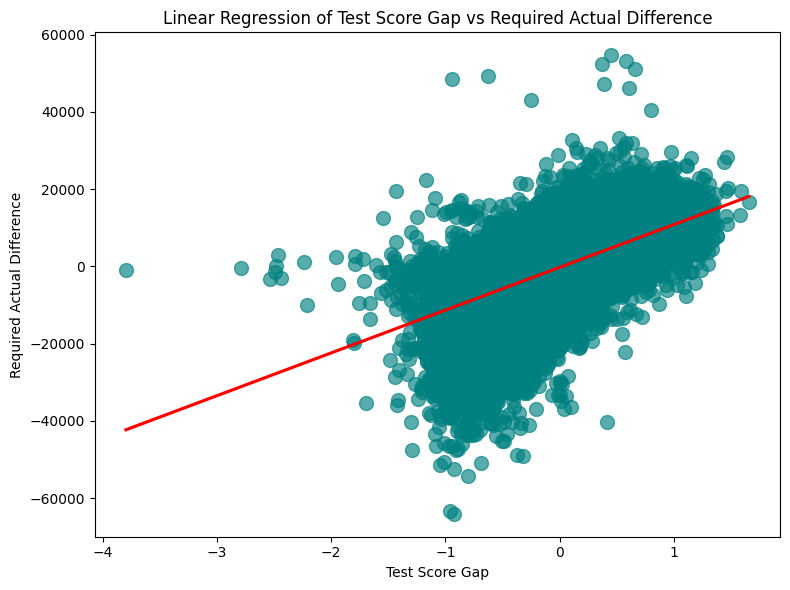

In [16]:
# linear regression analysis of testscore_gap vs req_actual_diff
plt.figure(figsize=(8, 6))
sns.regplot(
    data=dcd25,
    x="testscore_gap",
    y="req_actual_diff",
    scatter_kws={"s": 100, "alpha": 0.65, "color": "teal"},
    line_kws={"color": "red"},
)
plt.title("Linear Regression of Test Score Gap vs Required Actual Difference")
plt.xlabel("Test Score Gap")
plt.ylabel("Required Actual Difference")
plt.tight_layout()
plt.show()

There definitely seems to be a linear correlation between these two variables.

##### <b>*</b> Linear regression of percent hispanic and percent english language learners

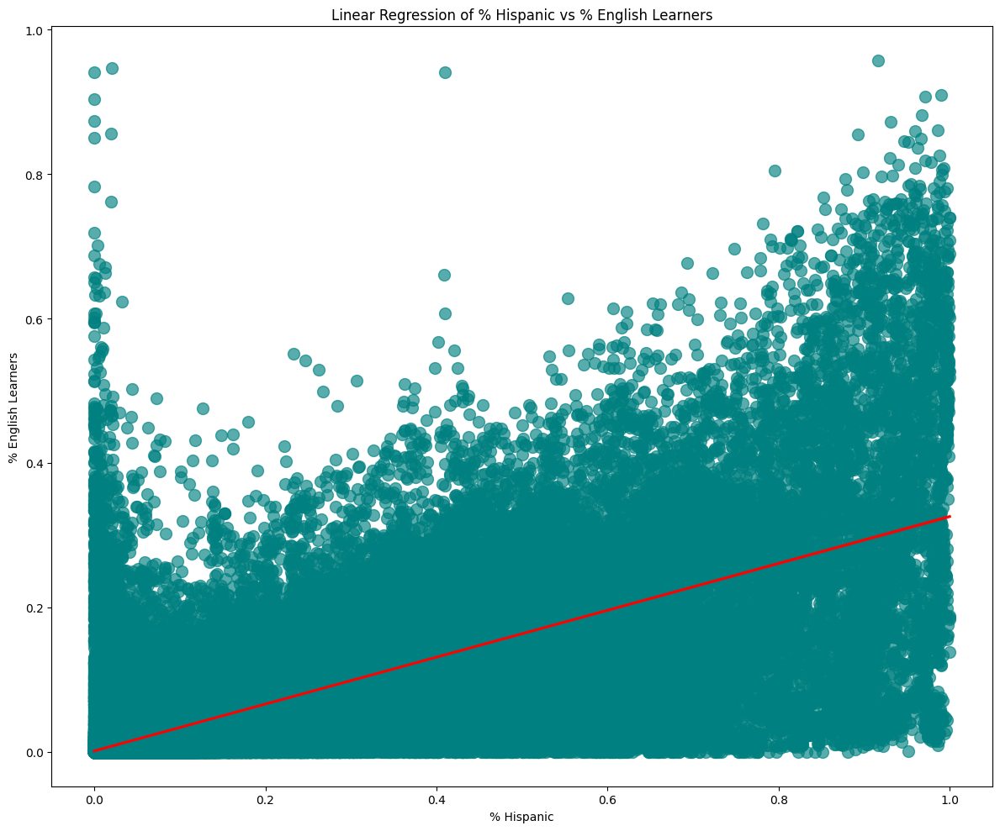

In [17]:
# linear regression analysis per_hispanic and per_english_learners
plt.figure(figsize=(12, 10))
sns.regplot(
    data=dcd25_renamed,
    x="per_hispanic",
    y="per_eng_learn",
    scatter_kws={"s": 100, "alpha": 0.65, "color": "teal"},
    line_kws={"color": "red"},
)
plt.title("Linear Regression of % Hispanic vs % English Learners")
plt.xlabel("% Hispanic")
plt.ylabel("% English Learners")
plt.tight_layout()
plt.show()

This pair shows a strong positive correlation, consistent with the correlation matrix (r ≈ 0.76) and the regression trend line.

##### Linear regression of Actual Spending versus Required spending

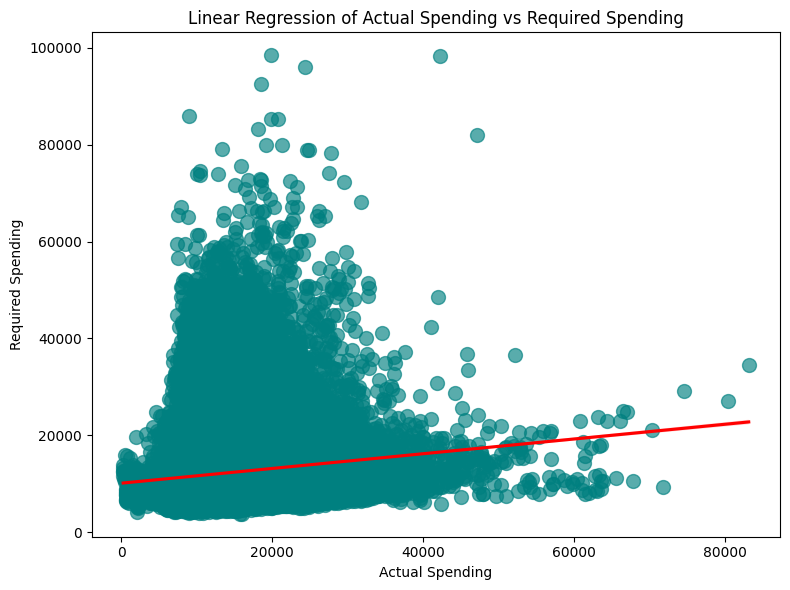

In [18]:
# linear regression analysis of testscore_gap vs req_actual_diff
plt.figure(figsize=(8, 6))
sns.regplot(
    data=dcd25,
    x="actual_spending",
    y="req_spending",
    scatter_kws={"s": 100, "alpha": 0.65, "color": "teal"},
    line_kws={"color": "red"},
)
plt.title("Linear Regression of Actual Spending vs Required Spending")
plt.xlabel("Actual Spending")
plt.ylabel("Required Spending")
plt.tight_layout()
plt.show()

##### Linear regression of testscore gap versus actual spending

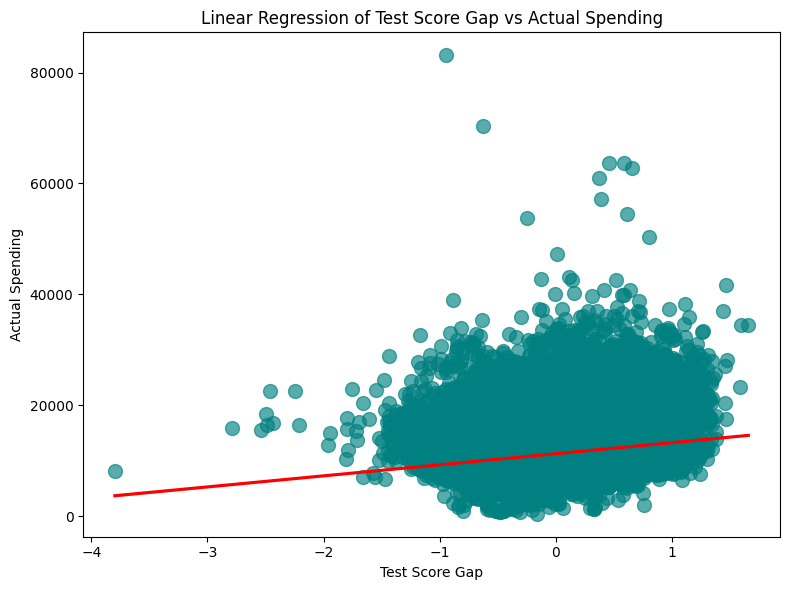

In [19]:
# linear regression analysis of testscore_gap vs actual spending
plt.figure(figsize=(8, 6))
sns.regplot(
    data=dcd25,
    x="testscore_gap",
    y="actual_spending",
    scatter_kws={"s": 100, "alpha": 0.65, "color": "teal"},
    line_kws={"color": "red"},
)
plt.title("Linear Regression of Test Score Gap vs Actual Spending")
plt.xlabel("Test Score Gap")
plt.ylabel("Actual Spending")
plt.tight_layout()
plt.show()

##### <b>*</b> linear regression of required spending versus percentage of students in poverty

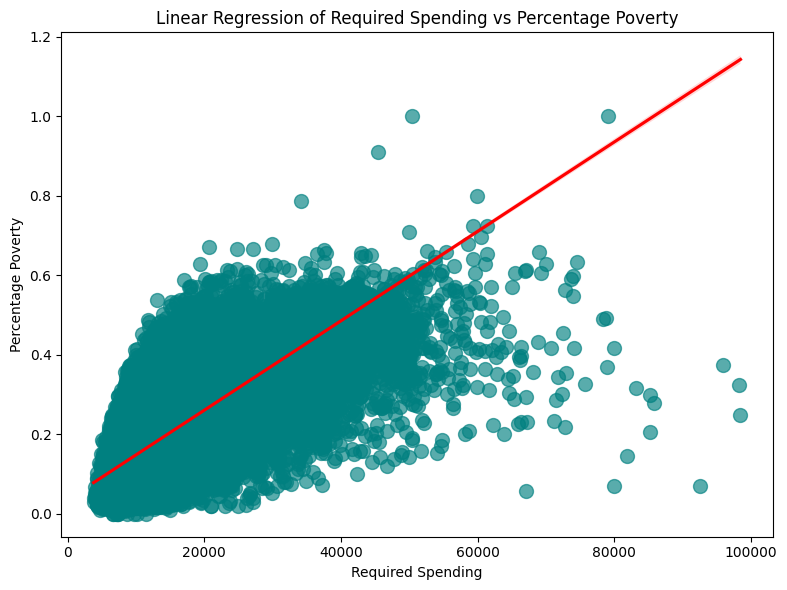

In [20]:
# linear regression
plt.figure(figsize=(8, 6))
sns.regplot(
    data=dcd25,
    x="req_spending",
    y="per_poverty",
    scatter_kws={"s": 100, "alpha": 0.65, "color": "teal"},
    line_kws={"color": "red"},
)
plt.title("Linear Regression of Required Spending vs Percentage Poverty")
plt.xlabel("Required Spending")
plt.ylabel("Percentage Poverty")
plt.tight_layout()
plt.show()

This pair not only seems like they should be correlated (the percent of students in poverty is likely to be correlated to the amount of money a district is required to spend per student), it also seems like the linear regression indicates that correlation.

### further analysis with other features

In [21]:
# Clean data: Convert empty strings to NaN and drop rows with missing critical values
df = dcd25_renamed.copy()  # work with a copy of the original DataFrame
df.replace('', pd.NA, inplace=True)
df['req_actual_diff'] = pd.to_numeric(df['req_actual_diff'], errors='coerce')
df['per_poverty'] = pd.to_numeric(df['per_poverty'], errors='coerce')
df['enrollment'] = pd.to_numeric(df['enrollment'], errors='coerce')
df['actual_spending'] = pd.to_numeric(df['actual_spending'], errors='coerce')

# Drop rows where critical analysis columns are missing
df_clean = df.dropna(subset=['req_actual_diff', 'per_poverty', 'enrollment'])

# Set style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)



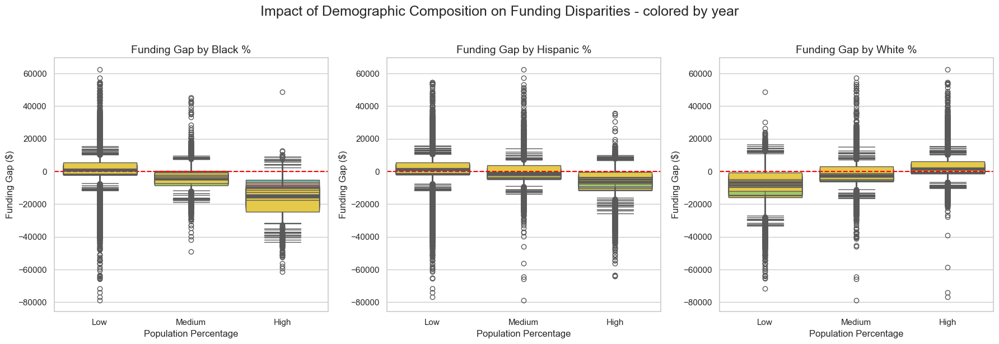

In [22]:
# Demographic Composition vs. Funding Gap (Boxplots)
# We'll focus on Black, Hispanic, and White populations as primary drivers
demographic_cols = ['per_black', 'per_hispanic', 'per_white']
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for i, col in enumerate(demographic_cols):
    # Filter out rows with missing demographic data
    subset = df_clean.dropna(subset=[col])
    
    # Create a categorical bin for the demographic percentage to make boxplots readable
    # e.g., Low (<20%), Medium (20-60%), High (>60%)
    bins = [0, 0.2, 0.6, 1.0]
    labels = ['Low', 'Medium', 'High']
    subset['demographic_bin'] = pd.cut(subset[col], bins=bins, labels=labels, include_lowest=True)
    
    sns.boxplot(x='demographic_bin', y='req_actual_diff', data=subset, ax=axes[i], palette='Set2', hue='year', dodge=False, legend=False)
    axes[i].set_title(f'Funding Gap by {col.replace("per_", "").replace("_", " ").title()} %', fontsize=14)
    axes[i].axhline(0, color='red', linestyle='--', linewidth=1.5)
    axes[i].set_xlabel('Population Percentage')
    axes[i].set_ylabel('Funding Gap ($)')

plt.suptitle('Impact of Demographic Composition on Funding Disparities - colored by year', fontsize=18, y=1.02)
plt.tight_layout()
plt.show()

Districts with higher percentages in these demographic groups are associated with larger negative funding gaps in this sample.

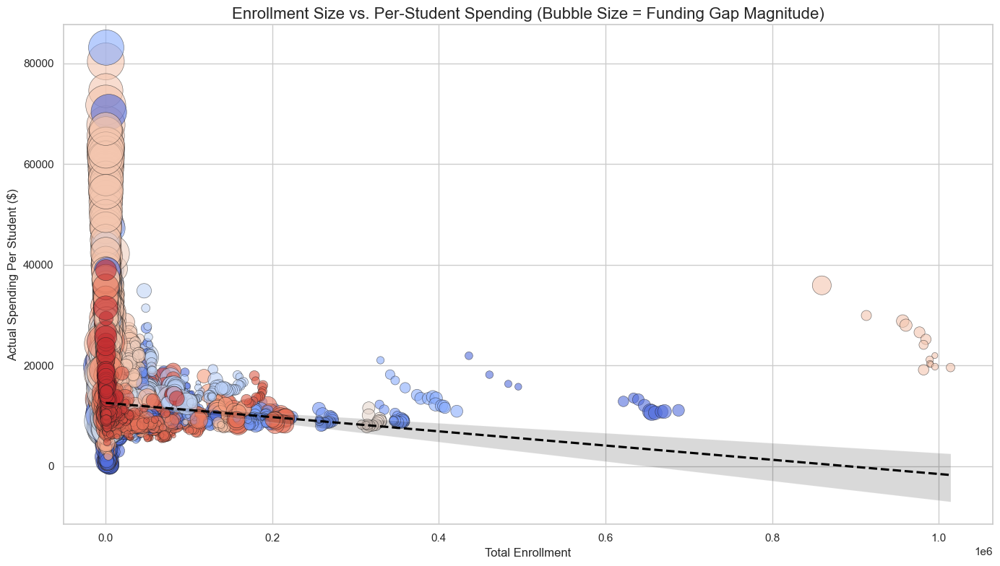

In [23]:
# Enrollment vs. Spending Efficiency (Bubble Chart)
plt.figure(figsize=(14, 8))
# Calculate absolute gap for sizing (magnitude of the problem regardless of direction)
df_clean['gap_magnitude'] = df_clean['req_actual_diff'].abs()

bubble = sns.scatterplot(
    data=df_clean,
    x='enrollment',
    y='actual_spending',
    size='gap_magnitude',
    hue='state_name',
    sizes=(20, 2000), # Scale bubble sizes
    palette='coolwarm',
    alpha=0.6,
    legend=False,
    edgecolor='k'
)

# Add a trend line for spending vs enrollment
sns.regplot(data=df_clean, x='enrollment', y='actual_spending', scatter=False, color='black', line_kws={'linestyle':'--'})

plt.title('Enrollment Size vs. Per-Student Spending (Bubble Size = Funding Gap Magnitude)', fontsize=16)
plt.xlabel('Total Enrollment', fontsize=12)
plt.ylabel('Actual Spending Per Student ($)', fontsize=12)
plt.tight_layout()
plt.show()

In [24]:
from scipy import stats

### Some Conclusions

#### PCA disadvantages/advantages
Advantages of the PC1/PC2 graph:
- Reduces 3 variables to 2 dimensions.
- Highlights unusual observations and dominant variation directions.

Disadvantages:
- Axes are linear combinations, not original variables, so interpretation is less direct.
- It can hide variable-specific details that are clearer in pairplots or correlation plots.

#### Are the data what I expect and usable?
- The data are generally usable after cleaning and type conversion.
- Correlations and regressions show coherent structure rather than random noise.

#### Do I see outliers?
- Yes. Outliers appear in bubble plots and in the PCA score space, especially districts with large funding-gap magnitude and unusual demographic/funding combinations.

#### Does PCA suggest reduced dimensionality?
- Yes, partially. The first one to two principal components capture major shared variation in the numeric features and provide a compact summary for visualization.
- Some policy-relevant signals remain feature-specific, so PCA should complement (not replace) feature-level analysis.

#### Did I use correlation information to choose regression features?
- Yes. Regressions were chosen using high-correlation and policy-relevant pairs, including:
  - per_hispanic vs per_eng_learn
  - testscore_gap vs req_actual_diff
  - req_spending vs per_poverty
  - actual_spending vs req_spending

### regplot with regression analysis req vs actual spending difference


##### this cell is included to illustrate the function regplotter, which is called in subsequent regplots

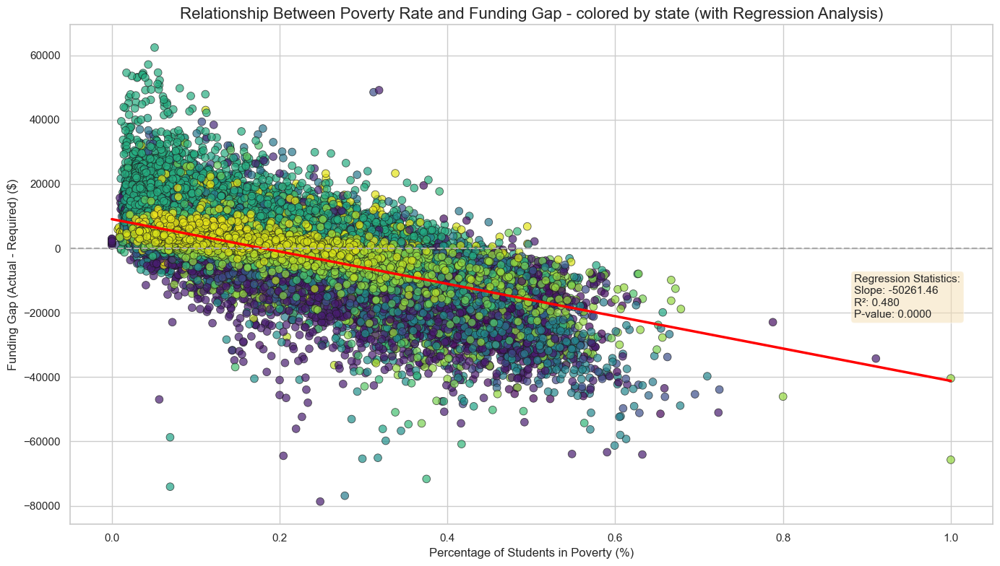

REGRESSION ANALYSIS SUMMARY
Dependent Variable: Funding Gap (req_actual_diff)
Independent Variable: Poverty Rate (per_poverty)

Regression Equation: y = 9088.45 + (-50261.46)x
R-squared: 0.480
P-value: 0.0000

Interpretation:
- For every 1% increase in poverty rate, funding gap changes by $-50261.46
- R² of 0.480 indicates moderate correlation
- P-value < 0.05 (statistically significant)


In [25]:
# Drop rows where critical analysis columns are missing
df_clean = df.dropna(subset=['req_actual_diff', 'per_poverty', 'enrollment'])

# Set style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (14, 8)

# Spending Gap vs. Poverty Rate WITH Regression Line
plt.figure(figsize=(14, 8))

# Create scatter plot
scatter = sns.scatterplot(
    data=df_clean, 
    x='per_poverty', 
    y='req_actual_diff', 
    hue='state_name', 
    palette='viridis', 
    alpha=0.7, 
    s=60,
    edgecolor='k',
    legend=False
)

# Add regression line (using all data points, not colored by state)
reg_line = sns.regplot(
    data=df_clean, 
    x='per_poverty', 
    y='req_actual_diff', 
    scatter=False,  # Don't show the scatter points again
    color='red', 
    line_kws={'linewidth': 2.5, 'label': 'Regression Line'},
    ci=95,  # Show 95% confidence interval
)

# Calculate and display R-squared value
slope, intercept, r_value, p_value, std_err = stats.linregress(
    df_clean['per_poverty'], 
    df_clean['req_actual_diff']
)
r_squared = r_value ** 2

# Add text annotation with regression statistics
text_str = f'Regression Statistics:\nSlope: {slope:.2f}\nR²: {r_squared:.3f}\nP-value: {p_value:.4f}'
plt.text(0.85, 0.5, text_str, transform=plt.gca().transAxes, 
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.title('Relationship Between Poverty Rate and Funding Gap - colored by state (with Regression Analysis)', fontsize=16)
plt.xlabel('Percentage of Students in Poverty (%)', fontsize=12)
plt.ylabel('Funding Gap (Actual - Required) ($)', fontsize=12)
plt.axhline(0, color='darkgray', linestyle='--', linewidth=1.5, label='Break-even Point')
plt.tight_layout()
plt.savefig('poverty_vs_funding_gap_regression.png', dpi=300)  # Save the figure with high resolution
plt.show()

# Optional: Print detailed regression output
print("=" * 60)
print("REGRESSION ANALYSIS SUMMARY")
print("=" * 60)
print(f"Dependent Variable: Funding Gap (req_actual_diff)")
print(f"Independent Variable: Poverty Rate (per_poverty)")
print(f"\nRegression Equation: y = {intercept:.2f} + ({slope:.2f})x")
print(f"R-squared: {r_squared:.3f}")
print(f"P-value: {p_value:.4f}")
print(f"\nInterpretation:")
print(f"- For every 1% increase in poverty rate, funding gap changes by ${slope:.2f}")
print(f"- R² of {r_squared:.3f} indicates {'strong' if r_squared > 0.5 else 'moderate' if r_squared > 0.2 else 'weak'} correlation")
print(f"- P-value {'< 0.05 (statistically significant)' if p_value < 0.05 else '> 0.05 (not statistically significant)'}")
print("=" * 60)

The plot shows that as poverty percentage increases, the funding gap becomes more negative (larger shortfall), which is consistent with the regression slope and suggests a meaningful inverse relationship in the sample.

## Try some of the above with a different dataset

In [26]:
# set new dataset
students = pd.read_csv('../stp_new.csv')
df = students.copy()


In [28]:
"""
Uncomment the four (4) lines following the blank line if you need to run this cell again. Otherwise,
running this cell by itself more than once will result in the region4 and region9 
columns being replaced multiple times, ending with missing values.  The lines following the blank line
will read the dataframe in again (freshly), drop columns with 95% or more data missing, 
and finally drop the state name and state abbreviation columns - since they can be inferred
fom other data.
"""

sid = pd.read_csv("..\..\SID.tsv", sep='\t')
sid_percent95, sid_percent95_count = show_missing_columns(sid, 95, 100)
SID_renamed = sid.drop(columns=sid_percent95.index.tolist())
SID_renamed.drop(columns=['stabbr', 'state_name'], inplace=True)



# put code for replacing region4 and region9 here
# step 1 - make a copy of the dataframe after dropping unneeded columns
SID_renamed_copy = SID_renamed.copy()
# step 2 - replace region4 and region9 with numerical values
region4_mapping = {
    'Northeast': 1,
    'Midwest': 2,
    'South': 3,
    'West': 4
}
SID_renamed_copy['region4'] = SID_renamed_copy['region4'].map(region4_mapping)
region9_mapping = {
    'East North Central': 1,
    'East South Central': 2,
    'Middle Atlantic': 3,
    'Mountain': 4,    
    'New England': 5,
    'Pacific': 6,
    'South Atlantic': 7,
    'West South Central': 8,
    'West North Central': 9,
}
SID_renamed_copy['region9'] = SID_renamed_copy['region9'].map(region9_mapping)
# copy the changed dataframe back to SID_renamed
SID_renamed = SID_renamed_copy
SID_renamed.to_csv("SID_renamed.csv", index=False)
# copy changed dataframe back to new
df_new = SID_renamed
# check new dataframe
df_new

| Column   |   Missing % |
|:---------|------------:|
| case     |       96.34 |
| citation |       96.41 |
| ruling   |       96.34 |
| casetype |       96.34 |
There are 4 columns with missing values between 95% and 100% in this dataset.


,year,statefip,region4,region9,effort,inc_effort,predicted_fedrevpp0_,predicted_fedrevpp10_,predicted_fedrevpp20_,predicted_fedrevpp30_,...,ftotinc_over185pov,ftotinc_under130pov,ftotinc_over130pov,inc_gap185_ratio,inc_gap130_ratio,coverage,state_chartershare,inc_pubsch,inc_nonpubsch,pubprv_incratio
0,2022,1,3,2,0.036929,0.039076,1108.6490,1668.6920,2511.6460,3780.4240,...,131652.5,22033.44,117350.2,0.238166,0.187758,0.825960,0.004447,94260.31,130562.7,0.721955
1,2022,2,4,6,0.043423,0.056036,1776.7740,3541.9490,7060.7790,14075.4700,...,144930.5,29949.38,132975.8,0.256784,0.225224,0.821983,0.064936,109327.70,109224.8,1.000942
2,2022,4,4,4,0.024628,0.026759,1067.8530,1859.7250,3238.8160,5640.5800,...,155276.1,26629.32,139645.2,0.240733,0.190693,0.881690,0.351399,118109.90,137257.1,0.860501
3,2022,5,3,8,0.038394,0.037691,1381.2480,2004.3170,2908.4460,4220.4190,...,127862.6,23495.69,113854.2,0.256578,0.206366,0.859202,0.097590,90338.76,102996.4,0.877106
4,2022,6,4,6,0.030721,0.036699,1214.3630,2042.9630,3436.9450,5782.0860,...,184344.8,25918.38,166658.3,0.197430,0.155518,0.882351,0.153031,141409.50,225058.4,0.628324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1525,1993,51,3,7,NaN,NaN,161.5866,247.9940,380.6070,584.1340,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1526,1993,53,4,6,NaN,NaN,108.5937,220.0093,445.7360,903.0553,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1527,1993,54,3,7,NaN,NaN,235.6424,301.9568,386.9335,495.8242,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1528,1993,55,2,1,NaN,NaN,112.1720,208.0872,386.0168,716.0889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
df_new["effort"] = pd.to_numeric(df_new["effort"], errors="coerce")
df_new["effort"] = df_new["effort"].replace([np.inf, -np.inf], np.nan).fillna(0)
df_new["effort"].isna().sum()

np.int64(0)

### regplots/scatterplots

####  regplot function students dataset mother

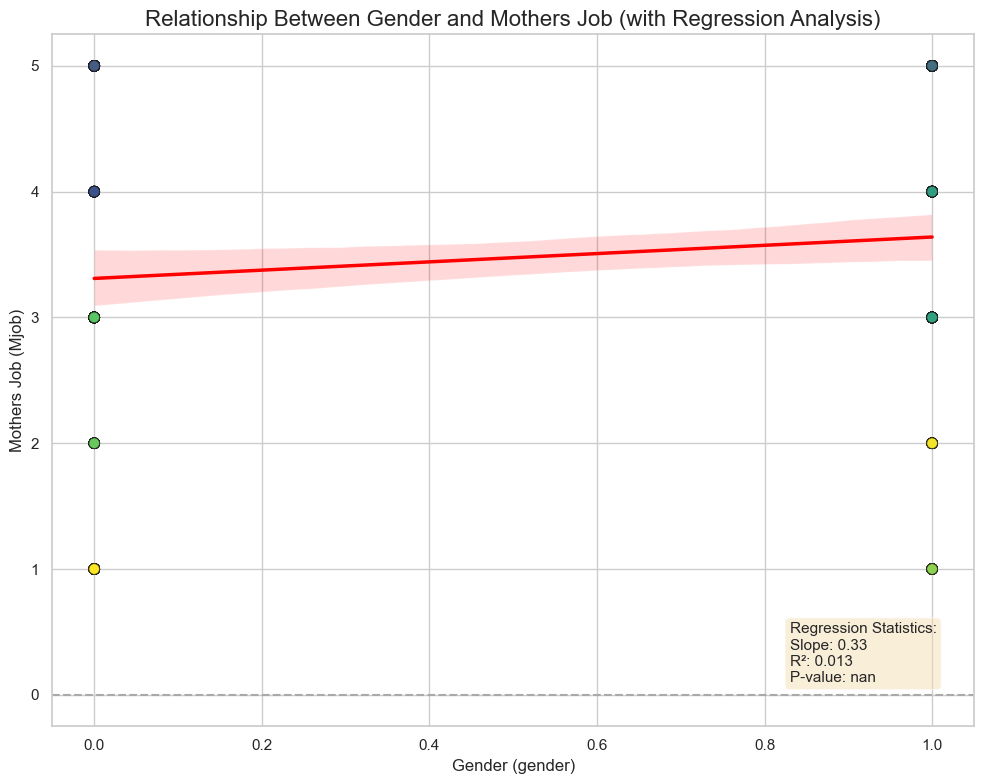

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  Mothers Job (Mjob)
Independent Variable: Gender (gender)

Regression Equation: y = 3.31 + (0.33)x
R-squared: 0.013
P-value: nan

Interpretation:
- For every 1-unit increase in gender, Mjob changes by 0.33
- R² of 0.013 indicates weak correlation
- P-value > 0.05 (not statistically significant)


In [ ]:
regplot_mother = regplotter(students, "gender", "Gender", "Mjob", "Mothers Job",  "Medu", "Mothers Education")

#### regplot function Percent Effort

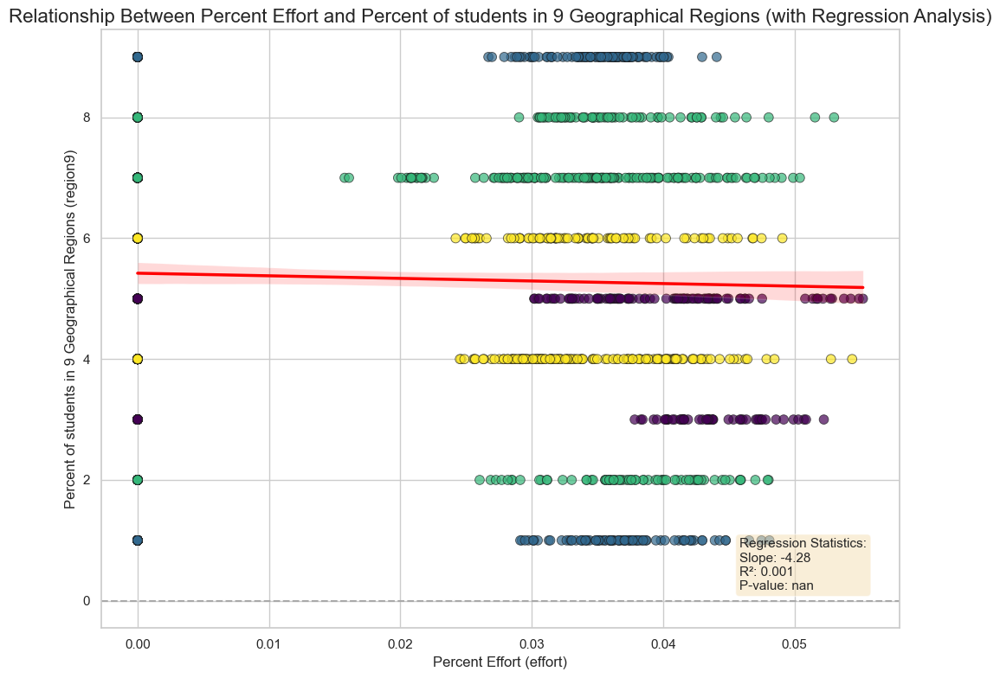

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  Percent of students in 9 Geographical Regions (region9)
Independent Variable: Percent Effort (effort)

Regression Equation: y = 5.42 + (-4.28)x
R-squared: 0.001
P-value: nan

Interpretation:
- For every 1-unit increase in effort, region9 changes by -4.28
- R² of 0.001 indicates weak correlation
- P-value > 0.05 (not statistically significant)


In [31]:
regplot_effort = regplotter(df_new, "effort", "Percent Effort", "region9", "Percent of students in 9 Geographical Regions",  "region4", "4 Geographical Regions")

#### regplot function predicted federal revenue per pupil

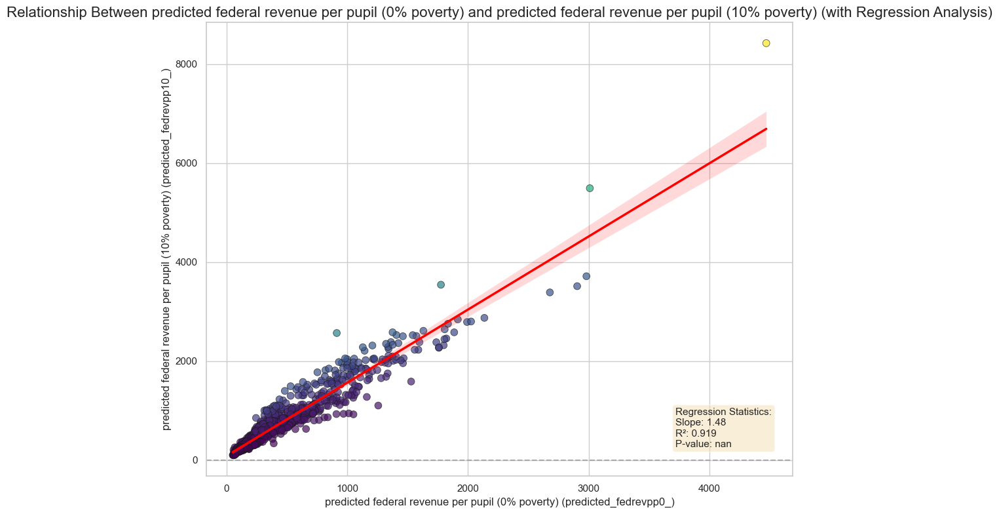

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  predicted federal revenue per pupil (10% poverty) (predicted_fedrevpp10_)
Independent Variable: predicted federal revenue per pupil (0% poverty) (predicted_fedrevpp0_)

Regression Equation: y = 81.44 + (1.48)x
R-squared: 0.919
P-value: nan

Interpretation:
- For every 1-unit increase in predicted_fedrevpp0_, predicted_fedrevpp10_ changes by 1.48
- R² of 0.919 indicates strong correlation
- P-value > 0.05 (not statistically significant)


In [32]:
sid_regplot = regplotter(df_new, "predicted_fedrevpp0_", "predicted federal revenue per pupil (0% poverty)", "predicted_fedrevpp10_", "predicted federal revenue per pupil (10% poverty)",  "predicted_fedrevpp20_", "predicted federal revenue per pupil (20% poverty)")

I believe that since these features are so closely related, a linear correlation is not unusual. This might be an instance where 2 or more features could be combined with little loss of predictive value.

#### regplot function predicted state revenue per pupil

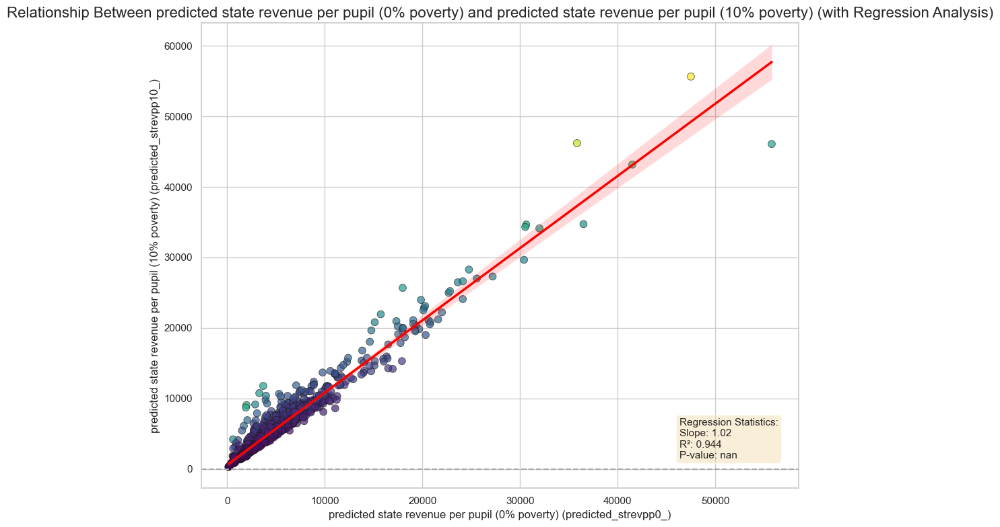

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  predicted state revenue per pupil (10% poverty) (predicted_strevpp10_)
Independent Variable: predicted state revenue per pupil (0% poverty) (predicted_strevpp0_)

Regression Equation: y = 595.99 + (1.02)x
R-squared: 0.944
P-value: nan

Interpretation:
- For every 1-unit increase in predicted_strevpp0_, predicted_strevpp10_ changes by 1.02
- R² of 0.944 indicates strong correlation
- P-value > 0.05 (not statistically significant)


In [33]:
regplot_pred_strevpp = regplotter(df_new, "predicted_strevpp0_", "predicted state revenue per pupil (0% poverty)", "predicted_strevpp10_", "predicted state revenue per pupil (10% poverty)",  "predicted_strevpp20_", "predicted state revenue per pupil (20% poverty)")

I believe this to be similar to the predicted pupil cost graph above.

#### regplot function predicted state revenue per pupil

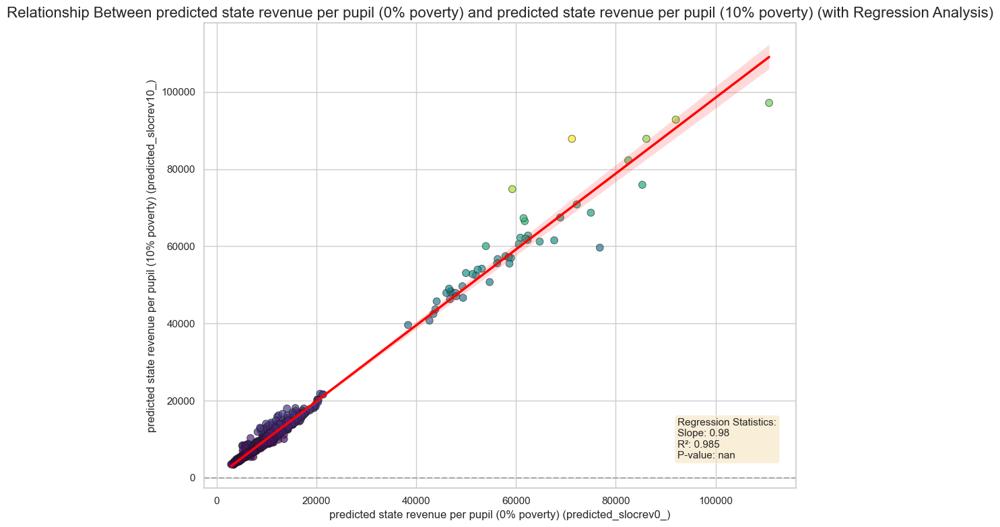

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  predicted state revenue per pupil (10% poverty) (predicted_slocrev10_)
Independent Variable: predicted state revenue per pupil (0% poverty) (predicted_slocrev0_)

Regression Equation: y = 224.03 + (0.98)x
R-squared: 0.985
P-value: nan

Interpretation:
- For every 1-unit increase in predicted_slocrev0_, predicted_slocrev10_ changes by 0.98
- R² of 0.985 indicates strong correlation
- P-value > 0.05 (not statistically significant)


In [34]:
regplot_pred_statrev = regplotter(df_new, "predicted_slocrev0_", "predicted state revenue per pupil (0% poverty)", "predicted_slocrev10_", "predicted state revenue per pupil (10% poverty)",  "predicted_slocrev20_", "predicted state revenue per pupil (20% poverty)")

#### regplot function predicted teacher pay 

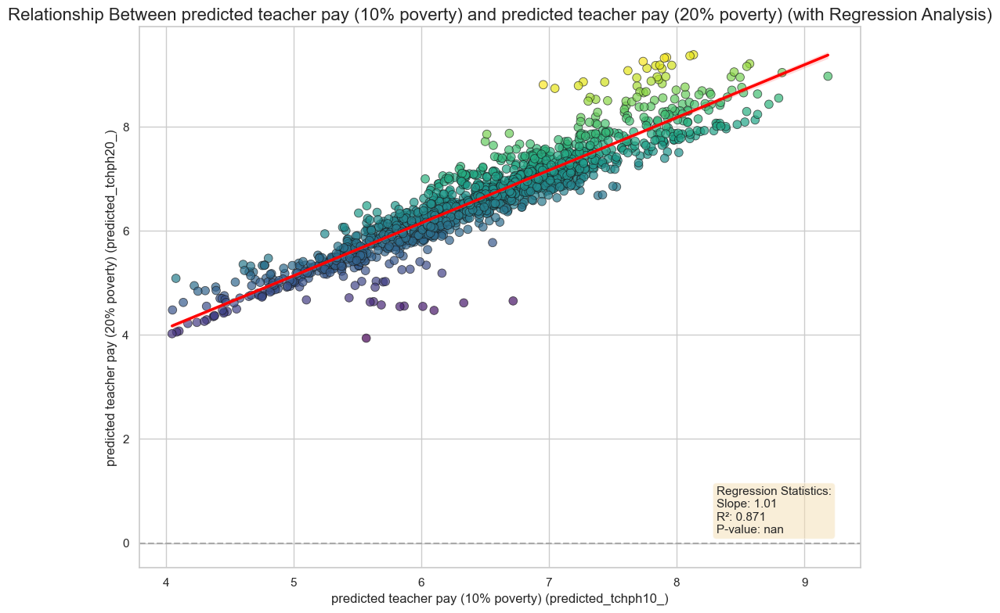

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  predicted teacher pay (20% poverty) (predicted_tchph20_)
Independent Variable: predicted teacher pay (10% poverty) (predicted_tchph10_)

Regression Equation: y = 0.07 + (1.01)x
R-squared: 0.871
P-value: nan

Interpretation:
- For every 1-unit increase in predicted_tchph10_, predicted_tchph20_ changes by 1.01
- R² of 0.871 indicates strong correlation
- P-value > 0.05 (not statistically significant)


In [35]:
regplot_predtchph = regplotter(df_new, "predicted_tchph10_", "predicted teacher pay (10% poverty)", "predicted_tchph20_", "predicted teacher pay (20% poverty)",  "predicted_tchph30_", "predicted teacher pay (30% poverty)")

#### regplot function Teacher Salary age 31/41/51

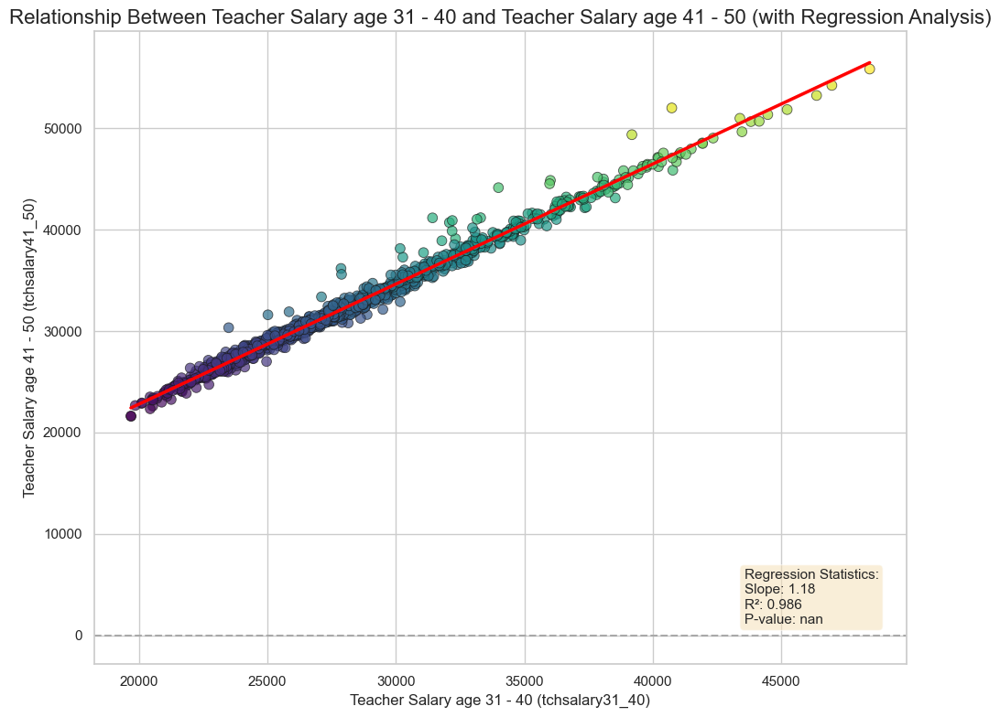

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  Teacher Salary age 41 - 50 (tchsalary41_50)
Independent Variable: Teacher Salary age 31 - 40 (tchsalary31_40)

Regression Equation: y = -883.68 + (1.18)x
R-squared: 0.986
P-value: nan

Interpretation:
- For every 1-unit increase in tchsalary31_40, tchsalary41_50 changes by 1.18
- R² of 0.986 indicates strong correlation
- P-value > 0.05 (not statistically significant)


In [36]:
regplot_tchsal = regplotter(df_new, "tchsalary31_40", "Teacher Salary age 31 - 40", "tchsalary41_50", "Teacher Salary age 41 - 50",  "tchsalary51_60", "Teacher Salary age 51 - 60")

#### regplot function Teacher Salary parity age 35/45/55

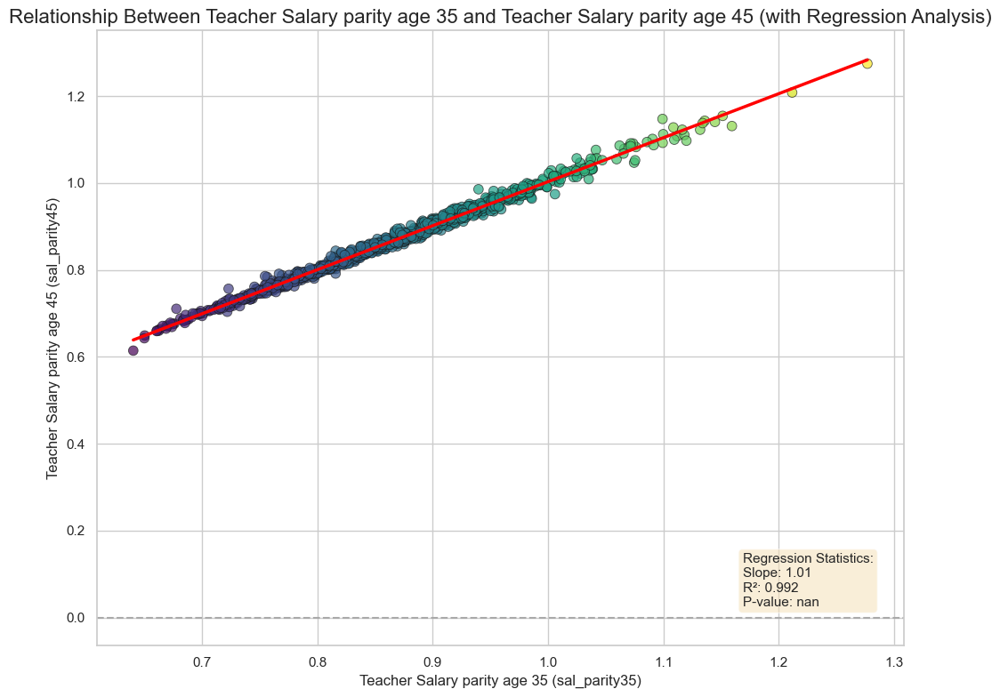

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  Teacher Salary parity age 45 (sal_parity45)
Independent Variable: Teacher Salary parity age 35 (sal_parity35)

Regression Equation: y = -0.01 + (1.01)x
R-squared: 0.992
P-value: nan

Interpretation:
- For every 1-unit increase in sal_parity35, sal_parity45 changes by 1.01
- R² of 0.992 indicates strong correlation
- P-value > 0.05 (not statistically significant)


In [37]:
regplot_tsp = regplotter(df_new, "sal_parity35", "Teacher Salary parity age 35", "sal_parity45", "Teacher Salary parity age 45",  "sal_parity55", "Teacher Salary parity age 55")

#### regplot function Total family income

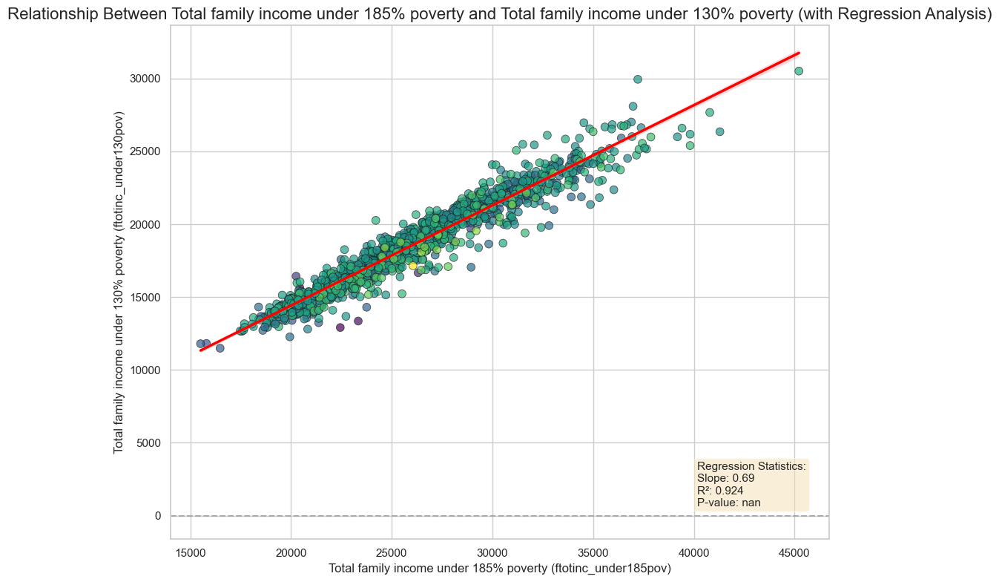

REGRESSION ANALYSIS SUMMARY
Dependent Variable:  Total family income under 130% poverty (ftotinc_under130pov)
Independent Variable: Total family income under 185% poverty (ftotinc_under185pov)

Regression Equation: y = 665.51 + (0.69)x
R-squared: 0.924
P-value: nan

Interpretation:
- For every 1-unit increase in ftotinc_under185pov, ftotinc_under130pov changes by 0.69
- R² of 0.924 indicates strong correlation
- P-value > 0.05 (not statistically significant)


In [38]:
regplot_tfi = regplotter(df_new, "ftotinc_under185pov", "Total family income under 185% poverty", "ftotinc_under130pov", 'Total family income under 130% poverty',  "inc_gap185_ratio", 'Income Gap Ratio (185% poverty)')

# 4. Storytelling With Data plot

Reproduce any graph of your choice in p. 136-150 of the Storytelling With Data book as best you can. ("The power of super-categories" to the end of chapter 5). You do not have to get the exact data values right, just the overall look and feel.

Reproduction of figure 5.13 on page 148 of Storytelling with Data

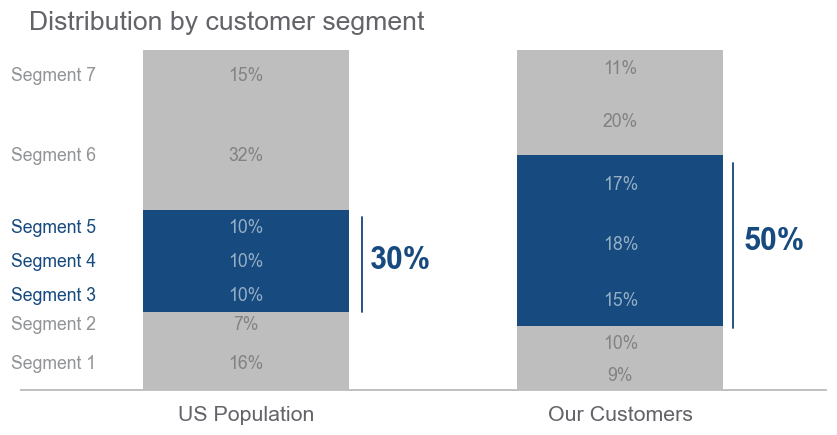

In [39]:
import numpy as np
import seaborn as sns

# Data
segments = [f"Segment {i}" for i in range(1, 8)]
us = np.array([16, 7, 10, 10, 10, 32, 15])
cust = np.array([9, 10, 15, 18, 17, 20, 11])

# Colors
GRAY4, GRAY6, GRAY7, GRAY9 = "#646369", "#828282", "#929497", "#BFBEBE"
BLUE1, BLUE4 = "#174A7E", "#94AFC5"
block_colors = [GRAY9]*2 + [BLUE1]*3 + [GRAY9]*2
value_colors = [GRAY6]*2 + [BLUE4]*3 + [GRAY6]*2
label_colors = [GRAY7]*2 + [BLUE1]*3 + [GRAY7]*2

# Theme
sns.set_theme(style="white", font="Arial")

fig, ax = plt.subplots(figsize=(12, 4), dpi=110)
fig.subplots_adjust(left=0.16, right=0.77, top=0.89, bottom=0.1)

bottom = np.zeros(2)
for i, seg in enumerate(segments):
    vals = np.array([us[i], cust[i]])
    bars = ax.bar([0, 1], vals, bottom=bottom, color=block_colors[i], width=0.55, linewidth=0)

    ax.text(-0.4, bottom[0] + us[i] / 2, seg, ha="right", va="center", fontsize=11.5, color=label_colors[i])

    for j, b in enumerate(bars):
        ax.text(
            b.get_x() + b.get_width()/2,
            b.get_y() + b.get_height()/2,
            f"{vals[j]}%",
            ha="center", va="center", fontsize=11.5, color=value_colors[i]
        )
    bottom += vals

ax.set_xlim(-0.6, 1.55)
ax.set_ylim(0, 102)
ax.set_xticks([0, 1], ["US Population", "Our Customers"])
ax.tick_params(bottom=False, left=False, labelleft=False)
for s in ["left", "right", "top"]:
    ax.spines[s].set_visible(False)
ax.spines["bottom"].set_color(GRAY9)
for t in ax.get_xticklabels():
    t.set_fontsize(14)
    t.set_color(GRAY4)

ax.text(-0.58, 106, "Distribution by customer segment", color=GRAY4, fontsize=17.4)
ax.axvline(0.31, ymin=0.225, ymax=0.5, color=BLUE1, linewidth=1.2)
ax.axvline(1.3, ymin=0.18, ymax=0.655, color=BLUE1, linewidth=1.2)
ax.text(0.33, 36, "30%", fontweight="bold", fontsize=20, color=BLUE1)
ax.text(1.33, 41.5, "50%", fontweight="bold", fontsize=20, color=BLUE1)

plt.savefig("SWD_p148_segment_distribution.png", dpi=300, bbox_inches="tight")
plt.show()